In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pprint
from pathlib import Path
import sys

ROOT_DIR = Path.cwd().parent
DATA_DIR = ROOT_DIR / 'data'
PLOT_DIR = ROOT_DIR / 'plots'

sys.path.append(str(ROOT_DIR))

from src.utils import (
    mean_mixed_corr_matrix, 
    plot_corr_heatmap, 
    WeightedStandardScaler,
    WeightedPCA,
    create_euclidean_distance_matrix,
    plot_dendrogram,
    get_clusters_from_dendrogram,
    print_cluster_summary,
    visualize_cluster_graph
)

years = [2008, 2012, 2016, 2020]
df = pd.read_csv(DATA_DIR / 'processed_data/probability_dataset.csv')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12224 entries, 0 to 12223
Data columns (total 62 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   gisjoin                             12224 non-null  object 
 1   year                                12224 non-null  int64  
 2   state                               12224 non-null  object 
 3   county                              12224 non-null  object 
 4   P(C)                                12224 non-null  float64
 5   P(area_in_C)                        12224 non-null  float64
 6   median_household_income             12224 non-null  int64  
 7   per_capita_income                   12224 non-null  int64  
 8   population_density                  12224 non-null  float64
 9   P(income_10k_to_15k|house_in_C)     12224 non-null  float64
 10  P(income_15k_to_25k|house_in_C)     12224 non-null  float64
 11  P(income_25k_plus|house_in_C)       12224

$$r_{XY} = \frac{ \sum_{i=1}^{n} w_i (x_i - \bar{x}_w) (y_i - \bar{y}_w) }{ \sqrt{ \sum_{i=1}^{n} w_i (x_i - \bar{x}_w)^2 } \cdot \sqrt{ \sum_{i=1}^{n} w_i (y_i - \bar{y}_w)^2 } }$$

In [20]:
id_cols = df.columns[:4].tolist()
target_cols = df.columns[-5:].tolist()
feature_cols = df.columns[4:-5].tolist()
all_cols = feature_cols + target_cols

# Compute mean mixed correlation matrices for the 3 train years [2008, 2012, 2016]
unweighted_avg_corr_matrix = mean_mixed_corr_matrix(df, columns=all_cols, weight_col=None, years=years[:-1])
weighted_avg_corr_matrix = mean_mixed_corr_matrix(df, columns=all_cols, weight_col='P(C)', years=years[:-1])

# Compute the difference
corr_diff = weighted_avg_corr_matrix - unweighted_avg_corr_matrix

# truncate to 3 decimal places
unweighted_avg_corr_matrix = unweighted_avg_corr_matrix.round(3)
weighted_avg_corr_matrix = weighted_avg_corr_matrix.round(3)
corr_diff = corr_diff.round(3)

# save to csv
CORR_DIR = DATA_DIR / 'correlation_matrices'
CORR_DIR.mkdir(exist_ok=True)
unweighted_avg_corr_matrix.to_csv(CORR_DIR / 'corr_matrix_unweighted.csv', index=True)
weighted_avg_corr_matrix.to_csv(CORR_DIR / 'corr_matrix_weighted.csv', index=True)
corr_diff.to_csv(CORR_DIR / 'corr_matrix_difference.csv', index=True)

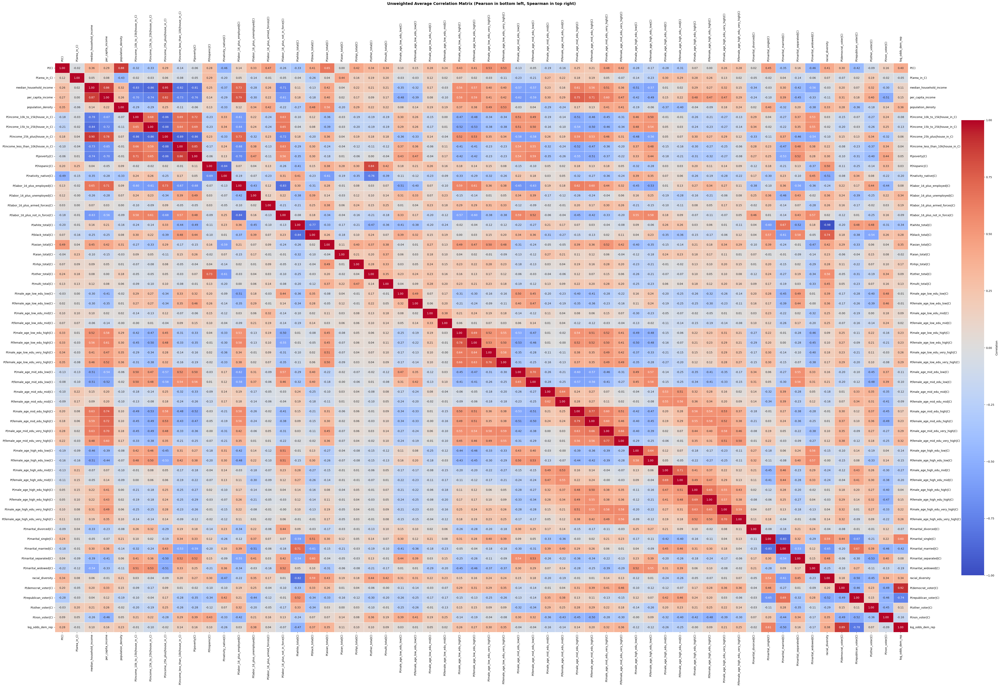

In [21]:
plot_corr_heatmap(
    unweighted_avg_corr_matrix,
    title='Unweighted Average Correlation Matrix (Pearson in bottom left, Spearman in top right)',
    save=True
)

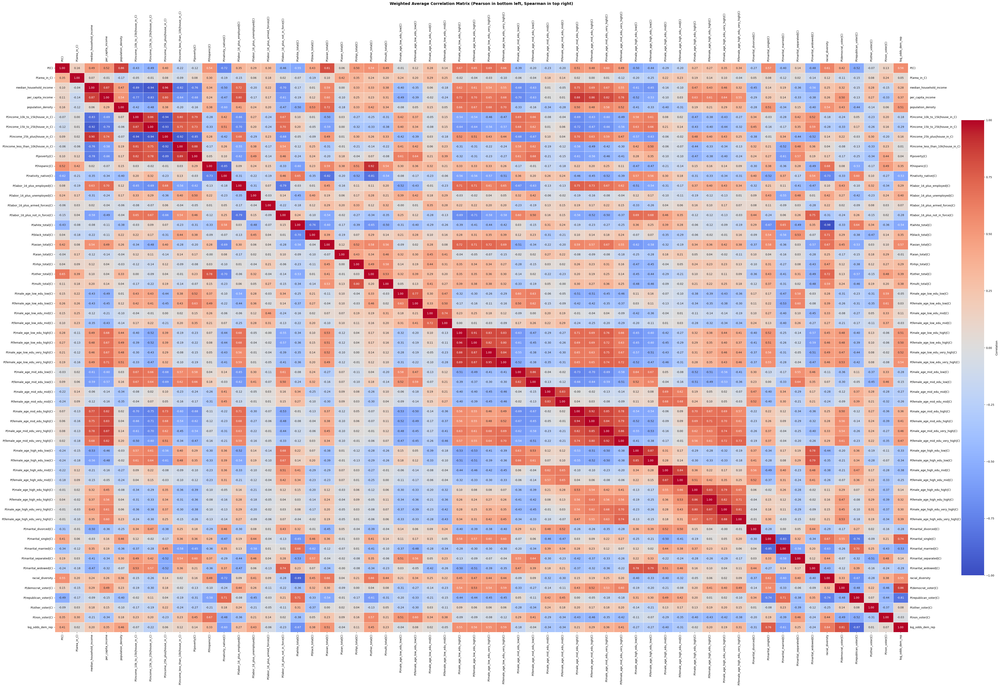

In [22]:
plot_corr_heatmap(
    weighted_avg_corr_matrix,
    title='Weighted Average Correlation Matrix (Pearson in bottom left, Spearman in top right)',
    save=True
)

In [23]:
# Compute the symmetric avg weighted corr matrix
weighted_corr_symmetric = (weighted_avg_corr_matrix + weighted_avg_corr_matrix.T) / 2

# Compute distances
distance_matrix = create_euclidean_distance_matrix(weighted_corr_symmetric).round(3)

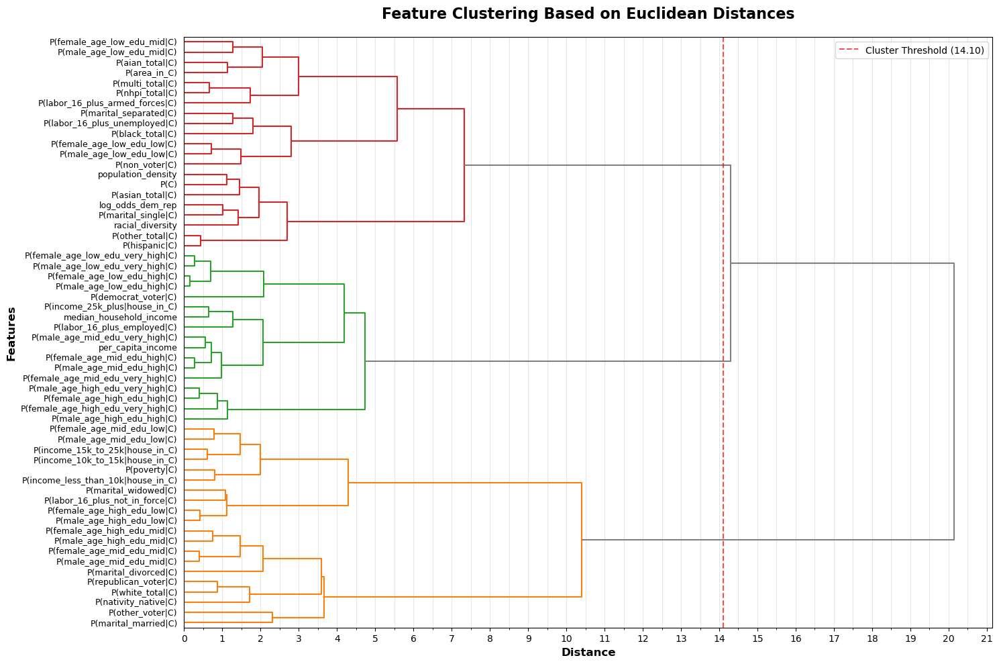

In [24]:
fig, ax, linkage_mat = plot_dendrogram(
    distance_matrix, 
    title="Feature Clustering Based on Euclidean Distances",
    save=True
)

In [25]:
# Extract clusters and print summary
clusters = get_clusters_from_dendrogram(
    corr_matrix=weighted_avg_corr_matrix, 
    linkage_matrix=linkage_mat,
    criterion='distance',
    t=2.5)
print_cluster_summary(clusters, weighted_avg_corr_matrix)

Found 14 clusters:

Cluster 7 (8 features):
  Features: median_household_income, per_capita_income, P(income_25k_plus|house_in_C), P(labor_16_plus_employed|C), P(male_age_mid_edu_high|C), P(female_age_mid_edu_high|C), P(male_age_mid_edu_very_high|C), P(female_age_mid_edu_very_high|C)
  Min internal absolute correlation: 0.466
  Average internal absolute correlation: 0.750
  Max internal absolute correlation: 0.957

Cluster 10 (6 features):
  Features: P(C), population_density, P(asian_total|C), P(marital_single|C), racial_diversity, log_odds_dem_rep
  Min internal absolute correlation: 0.510
  Average internal absolute correlation: 0.631
  Max internal absolute correlation: 0.862

Cluster 5 (6 features):
  Features: P(income_10k_to_15k|house_in_C), P(income_15k_to_25k|house_in_C), P(income_less_than_10k|house_in_C), P(poverty|C), P(male_age_mid_edu_low|C), P(female_age_mid_edu_low|C)
  Min internal absolute correlation: 0.578
  Average internal absolute correlation: 0.721
  Max interna

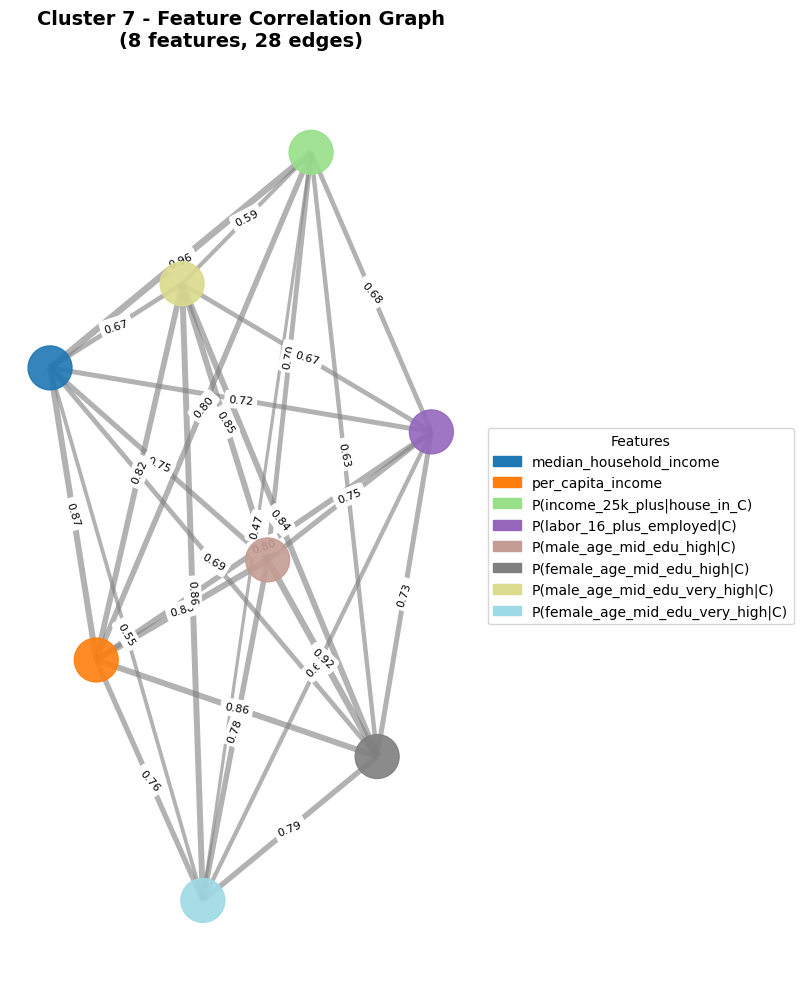

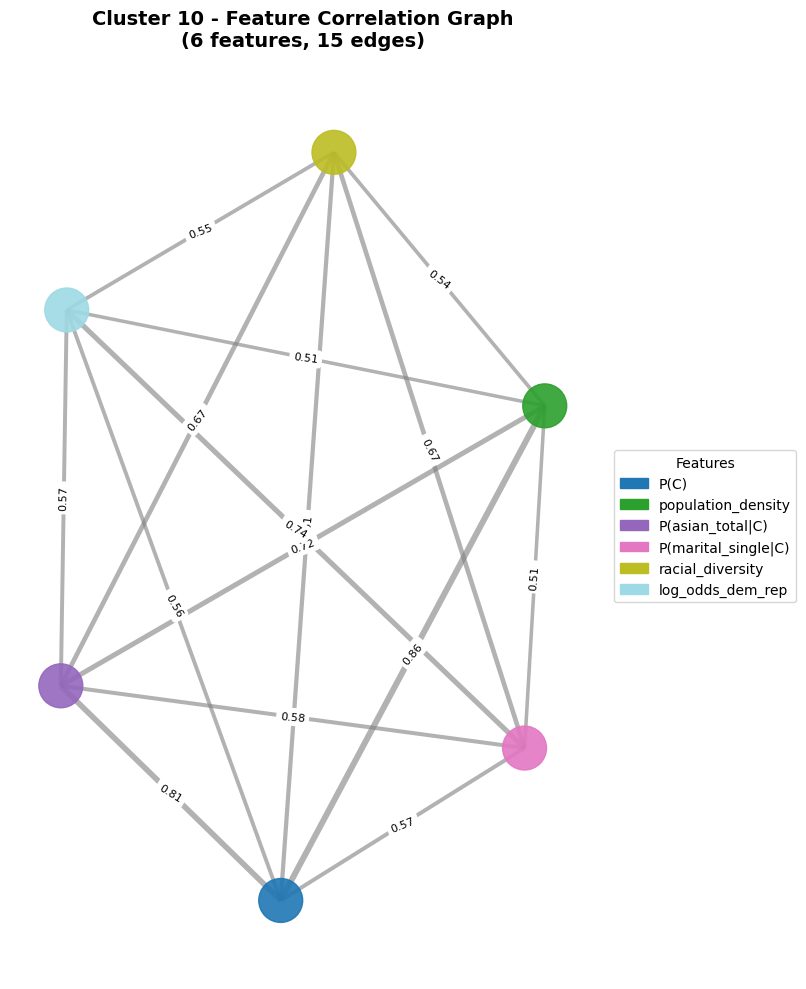

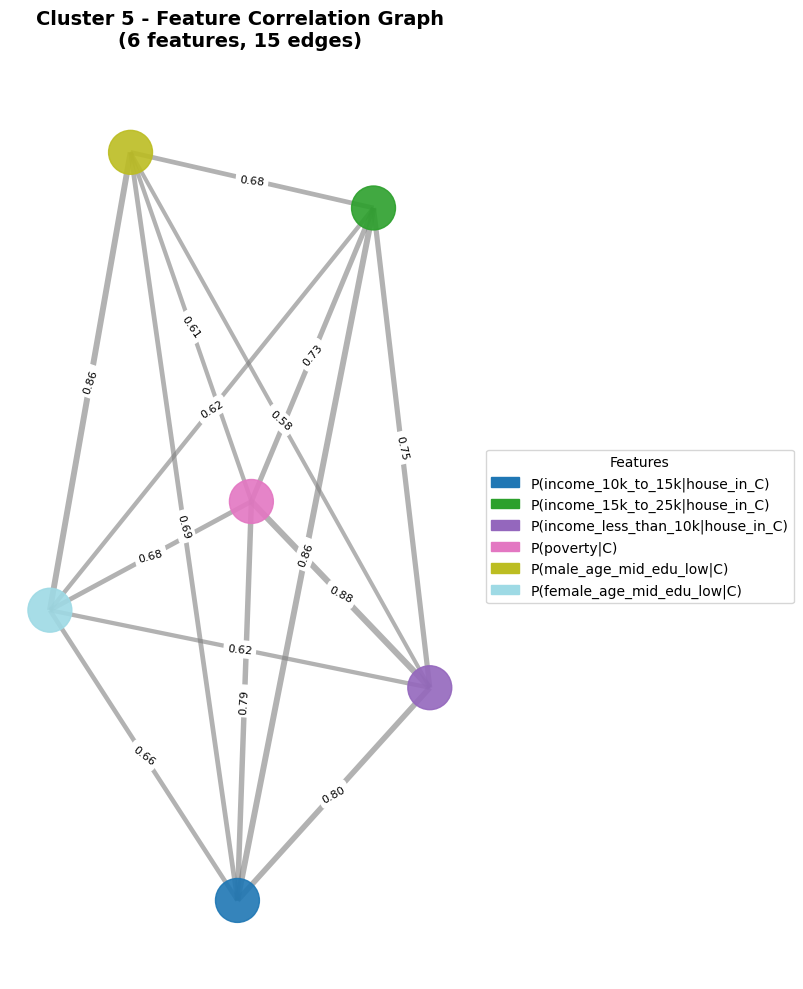

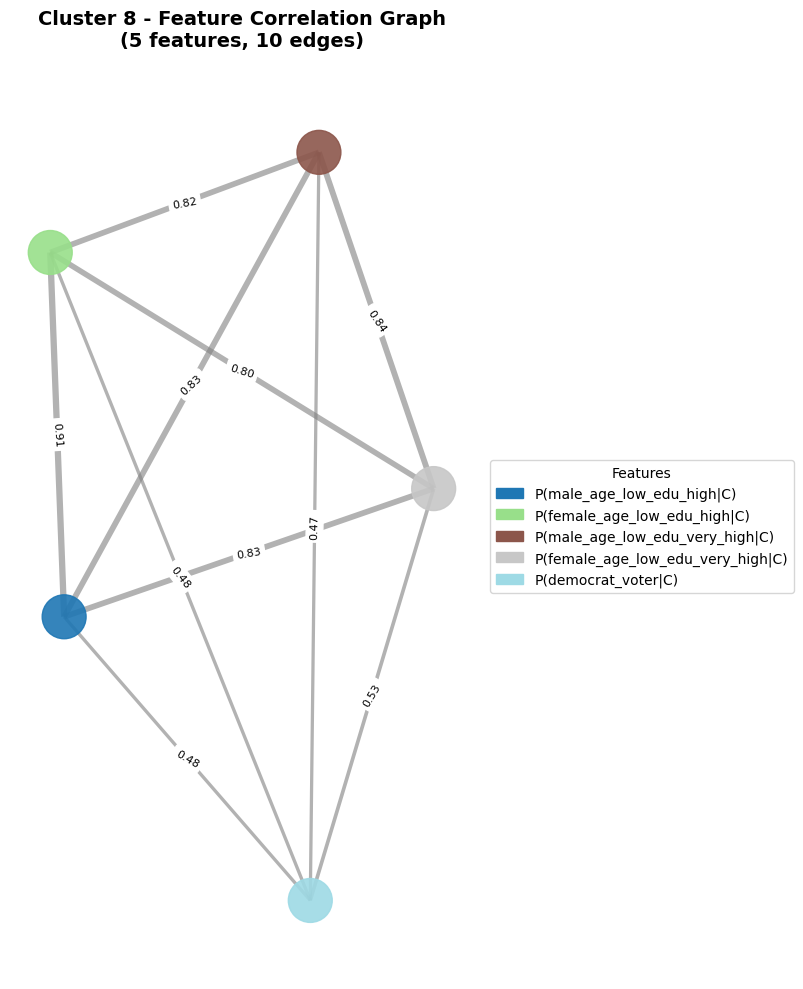

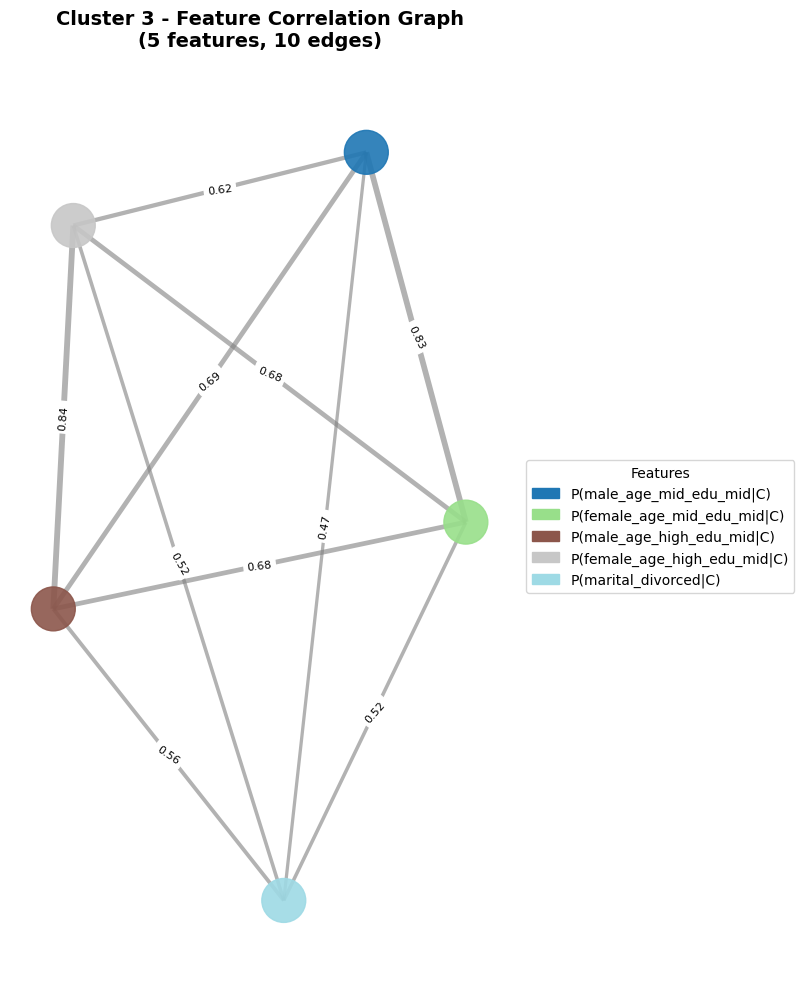

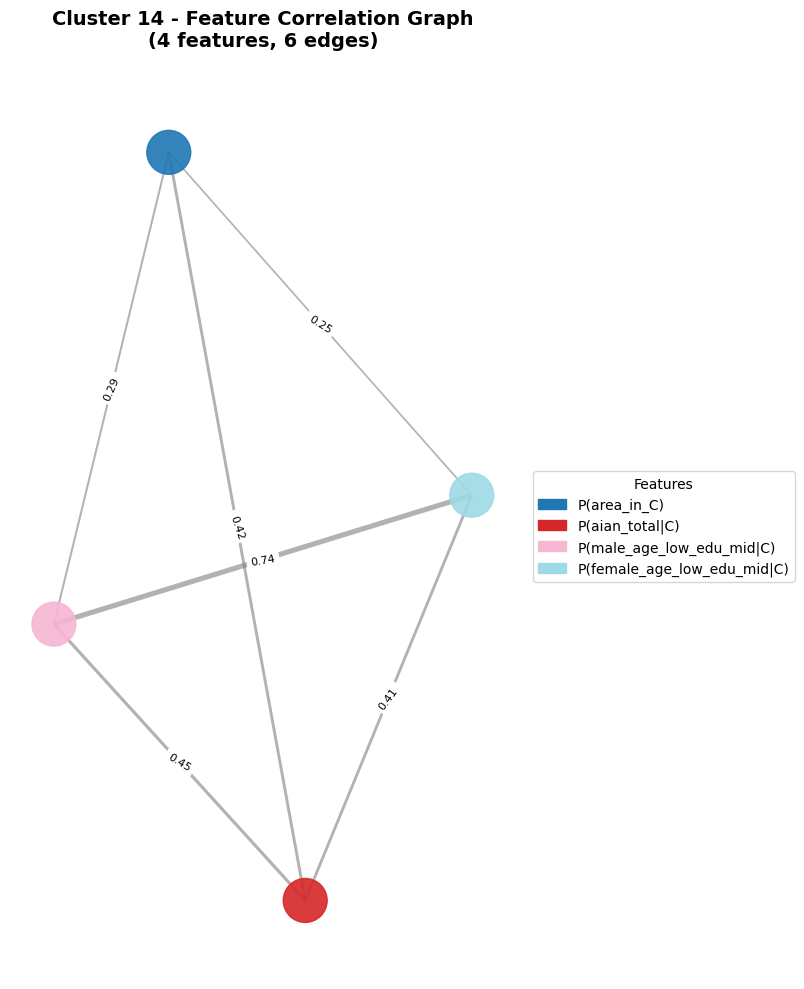

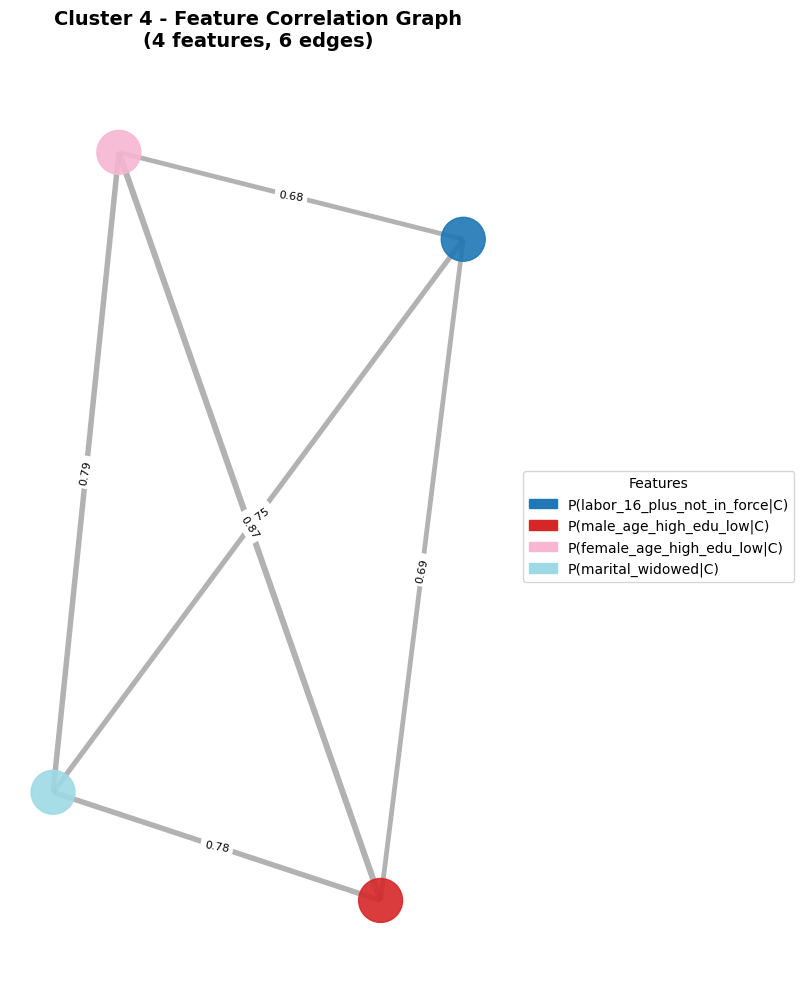

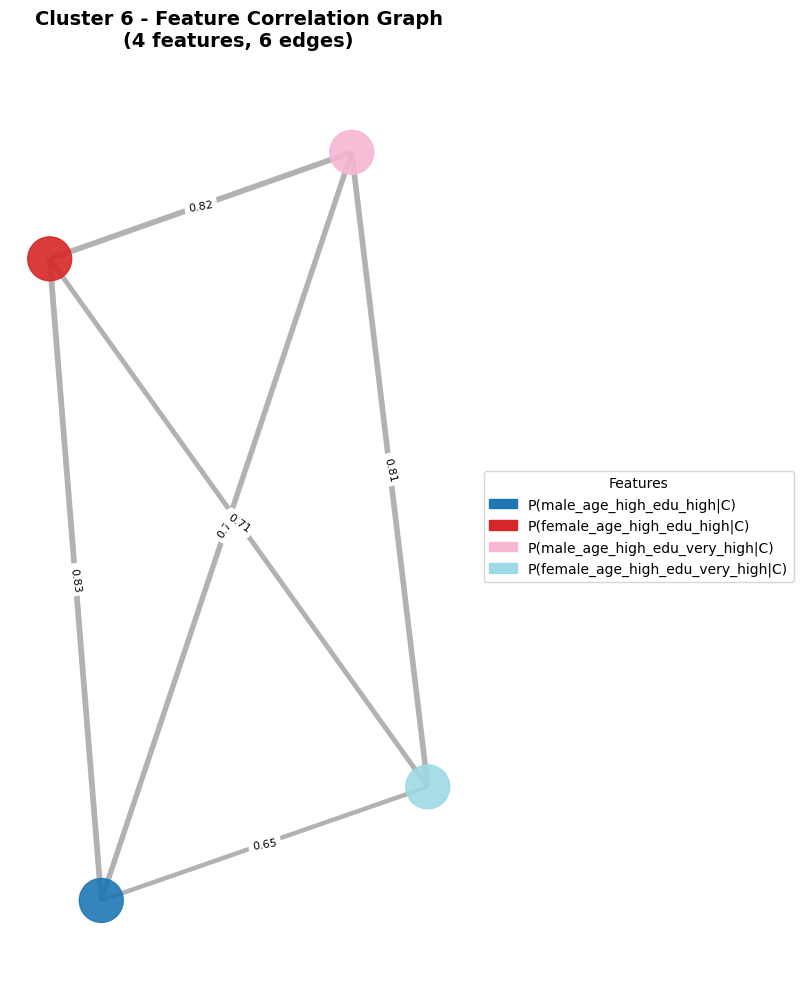

In [26]:
# Visualize top 8 clusters
top_8_clusters = dict(list(clusters.items())[:8])
visualize_cluster_graph(
    top_8_clusters,
    weighted_avg_corr_matrix,
    unique_node_colors=True,
    show_node_labels=False,
    show_edge_labels=True,
    add_legend=True,
    save=True
)

In [33]:
# Add a column for winner of each county
df["winner"] = 0
df.loc[df["P(democrat_voter|C)"] > df["P(republican_voter|C)"],"winner"] = 1

# Create dictionary mapping demographic types to feature lists
demographic_types = {
    "id": id_cols,
    "general": ["P(C)", "P(area_in_C)", "population_density"],
    "household_income": ["median_household_income", "per_capita_income", "P(poverty|C)"] + [col for col in df.columns if "income_" in col],
    "ethnicity": ["P(hispanic|C)", "P(nativity_native|C)"],
    "labor": [col for col in df.columns if "labor_" in col],
    "race": [col for col in df.columns if "_total|C)" in col] + ["racial_diversity"],
    "sex_age_edu": [col for col in df.columns if "edu_" in col],
    "marital": [col for col in df.columns if "marital_" in col],
    "target": [col for col in df.columns if "voter|C)" in col] + ["log_odds_dem_rep", "winner"]
}

demographic_types

{'id': ['gisjoin', 'year', 'state', 'county'],
 'general': ['P(C)', 'P(area_in_C)', 'population_density'],
 'household_income': ['median_household_income',
  'per_capita_income',
  'P(poverty|C)',
  'P(income_10k_to_15k|house_in_C)',
  'P(income_15k_to_25k|house_in_C)',
  'P(income_25k_plus|house_in_C)',
  'P(income_less_than_10k|house_in_C)'],
 'ethnicity': ['P(hispanic|C)', 'P(nativity_native|C)'],
 'labor': ['P(labor_16_plus_employed|C)',
  'P(labor_16_plus_unemployed|C)',
  'P(labor_16_plus_armed_forces|C)',
  'P(labor_16_plus_not_in_force|C)'],
 'race': ['P(white_total|C)',
  'P(black_total|C)',
  'P(asian_total|C)',
  'P(aian_total|C)',
  'P(nhpi_total|C)',
  'P(other_total|C)',
  'P(multi_total|C)',
  'racial_diversity'],
 'sex_age_edu': ['P(male_age_low_edu_low|C)',
  'P(female_age_low_edu_low|C)',
  'P(male_age_low_edu_mid|C)',
  'P(female_age_low_edu_mid|C)',
  'P(male_age_low_edu_high|C)',
  'P(female_age_low_edu_high|C)',
  'P(male_age_low_edu_very_high|C)',
  'P(female_age

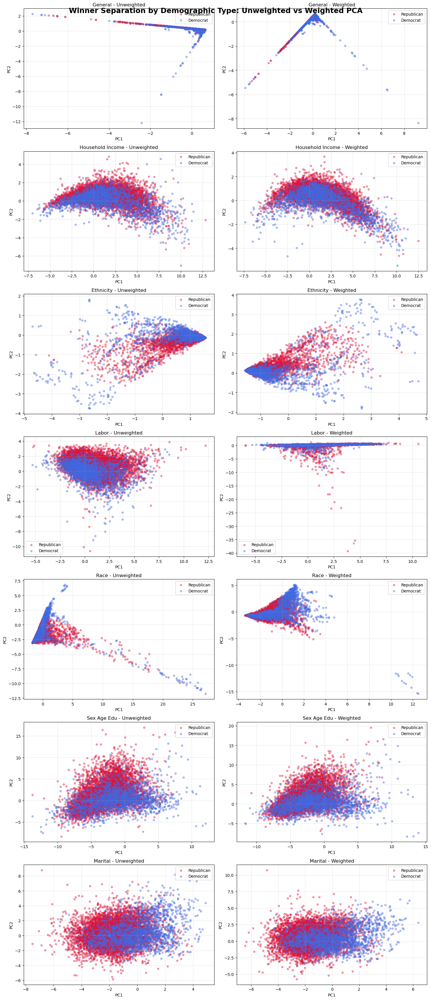

In [37]:
# Analyze winner separation by demographic type using PCA (Unweighted vs Weighted)
import matplotlib.pyplot as plt
from src.utils import WeightedPCA, WeightedStandardScaler

# Define deeper colors with higher transparency
blue_deep = '#4169E1'  # Royal blue for Democrat (winner=1)
red_deep = '#DC143C'   # Crimson for Republican (winner=0)
alpha_level = 0.4      # Increased transparency for better overlap visibility

# Filter to training years
train_df = df[df['year'].isin(years[:-1])]

# Demographic types to analyze (excluding id and target)
demo_types = [k for k in demographic_types.keys() if k not in ['id', 'target']]

# Create subplots: 7 rows x 2 columns (one row per demographic type, unweighted vs weighted)
fig, axes = plt.subplots(7, 2, figsize=(15, 35))  # Taller figure for 7 rows

for i, demo_type in enumerate(demo_types):
    features = [f for f in demographic_types[demo_type] if f not in ['P(C)', 'winner']]  # Exclude weight and target columns

    # Subset data: features + winner + weights
    sub_df = train_df[features + ['winner', 'P(C)']].dropna()

    if sub_df.empty or len(sub_df) < 10:  # Skip if insufficient data
        for j in range(2):
            axes[i, j].text(0.5, 0.5, f'Insufficient data for {demo_type}', ha='center', va='center', transform=axes[i, j].transAxes)
            axes[i, j].set_title(f'{demo_type.replace("_", " ").title()} - {"Unweighted" if j==0 else "Weighted"}')
        continue

    X = sub_df[features].values
    weights_weighted = sub_df['P(C)'].values
    weights_unweighted = np.ones(len(sub_df))  # Unweighted
    winner = sub_df['winner'].values

    # Standardize features (same for both)
    scaler = WeightedStandardScaler()
    X_scaled = scaler.fit_transform(X, weights_weighted)  # Use weighted scaling for consistency

    # Unweighted PCA
    pca_unweighted = WeightedPCA()
    X_pca_unweighted = pca_unweighted.fit_transform(X_scaled, weights_unweighted, n_components=2)

    # Weighted PCA
    pca_weighted = WeightedPCA()
    X_pca_weighted = pca_weighted.fit_transform(X_scaled, weights_weighted, n_components=2)

    # Plot Unweighted (left)
    ax = axes[i, 0]
    ax.scatter(X_pca_unweighted[winner == 0, 0], X_pca_unweighted[winner == 0, 1],
               c=red_deep, label='Republican', alpha=alpha_level, s=20)
    ax.scatter(X_pca_unweighted[winner == 1, 0], X_pca_unweighted[winner == 1, 1],
               c=blue_deep, label='Democrat', alpha=alpha_level, s=20)
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_title(f'{demo_type.replace("_", " ").title()} - Unweighted')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot Weighted (right)
    ax = axes[i, 1]
    ax.scatter(X_pca_weighted[winner == 0, 0], X_pca_weighted[winner == 0, 1],
               c=red_deep, label='Republican', alpha=alpha_level, s=20)
    ax.scatter(X_pca_weighted[winner == 1, 0], X_pca_weighted[winner == 1, 1],
               c=blue_deep, label='Democrat', alpha=alpha_level, s=20)
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_title(f'{demo_type.replace("_", " ").title()} - Weighted')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('Winner Separation by Demographic Type: Unweighted vs Weighted PCA', fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

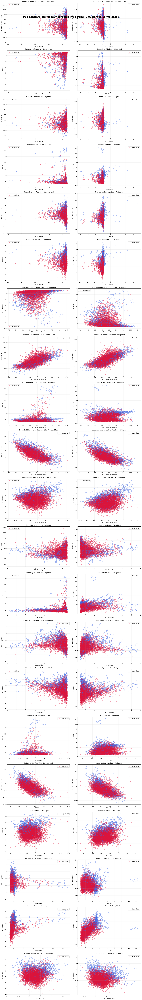

In [39]:
# Analyze PC1 scatterplots for pairs of demographic types (Unweighted vs Weighted)
import itertools

# Get all pairs of demographic types excluding id and target
demo_types = [k for k in demographic_types.keys() if k not in ['id', 'target']]
pairs = list(itertools.combinations(demo_types, 2))

# Create subplots: one row per pair, unweighted vs weighted
fig, axes = plt.subplots(len(pairs), 2, figsize=(15, 5 * len(pairs)))

for i, (A, B) in enumerate(pairs):
    features_A = [f for f in demographic_types[A] if f not in ['P(C)', 'winner']]
    features_B = [f for f in demographic_types[B] if f not in ['P(C)', 'winner']]
    
    # Subset data: features from both types + winner + weights
    sub_df = train_df[features_A + features_B + ['winner', 'P(C)']].dropna()
    
    if sub_df.empty or len(sub_df) < 10:
        for j in range(2):
            axes[i, j].text(0.5, 0.5, f'Insufficient data for {A} vs {B}', ha='center', va='center', transform=axes[i, j].transAxes)
            axes[i, j].set_title(f'{A.replace("_", " ").title()} vs {B.replace("_", " ").title()} - {"Unweighted" if j==0 else "Weighted"}')
        continue
    
    X_A = sub_df[features_A].values
    X_B = sub_df[features_B].values
    weights = sub_df['P(C)'].values
    winner = sub_df['winner'].values
    
    # Standardize features
    scaler_A = WeightedStandardScaler()
    X_A_scaled = scaler_A.fit_transform(X_A, weights)
    scaler_B = WeightedStandardScaler()
    X_B_scaled = scaler_B.fit_transform(X_B, weights)
    
    # Unweighted PCA
    pca_A_unw = WeightedPCA()
    pc1_A_unw = pca_A_unw.fit_transform(X_A_scaled, np.ones(len(sub_df)), n_components=1)
    pca_B_unw = WeightedPCA()
    pc1_B_unw = pca_B_unw.fit_transform(X_B_scaled, np.ones(len(sub_df)), n_components=1)
    
    # Weighted PCA
    pca_A_w = WeightedPCA()
    pc1_A_w = pca_A_w.fit_transform(X_A_scaled, weights, n_components=1)
    pca_B_w = WeightedPCA()
    pc1_B_w = pca_B_w.fit_transform(X_B_scaled, weights, n_components=1)
    
    # Plot Unweighted (left)
    ax = axes[i, 0]
    ax.scatter(pc1_A_unw.flatten(), pc1_B_unw.flatten(),
               c=[red_deep if w == 0 else blue_deep for w in winner], alpha=alpha_level, s=20)
    ax.set_xlabel(f'PC1 {A.replace("_", " ").title()}')
    ax.set_ylabel(f'PC1 {B.replace("_", " ").title()}')
    ax.set_title(f'{A.replace("_", " ").title()} vs {B.replace("_", " ").title()} - Unweighted')
    ax.legend(['Republican', 'Democrat'])
    ax.grid(True, alpha=0.15)
    
    # Plot Weighted (right)
    ax = axes[i, 1]
    ax.scatter(pc1_A_w.flatten(), pc1_B_w.flatten(),
               c=[red_deep if w == 0 else blue_deep for w in winner], alpha=alpha_level, s=20)
    ax.set_xlabel(f'PC1 {A.replace("_", " ").title()}')
    ax.set_ylabel(f'PC1 {B.replace("_", " ").title()}')
    ax.set_title(f'{A.replace("_", " ").title()} vs {B.replace("_", " ").title()} - Weighted')
    ax.legend(['Republican', 'Democrat'])
    ax.grid(True, alpha=0.15)

plt.suptitle('PC1 Scatterplots for Demographic Type Pairs: Unweighted vs Weighted', fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()